In [16]:
from matplotlib import pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
torch.set_printoptions(edgeitems=2)
torch.manual_seed(123)

https://github.com/pytorch/vision

In [17]:
from torchvision import models

In [18]:
#View pretrained models

dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

In [19]:
alexnet = models.AlexNet() #object that can run AlexNet architecture
# contains only the architecture but not the pretrained weight. 

In [20]:
#load the architecture with retrained weights

# resnet = models.resnet101(pretrained=True)
resnet = models.resnet18(pretrained=True)

C:\Users\Ashim Karki\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Ashim Karki\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\Ashim Karki/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth
100.0%


In [21]:
# view the model
# taking as input one or more images and producing an equal number
# of scores for each of the 1,000 ImageNet classes

resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [22]:
from torchvision import transforms

# Composes several transforms together. 
preprocess = transforms.Compose([ 
    transforms.Resize(256), # scale the input image to 256x256
    transforms.CenterCrop(224), # crop to 224x224 around the center
    transforms.ToTensor(), # transform it to a tensor. here a 3d array of color, height and width
    transforms.Normalize( # normalization of RGB. needs to match with what was presented during training
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

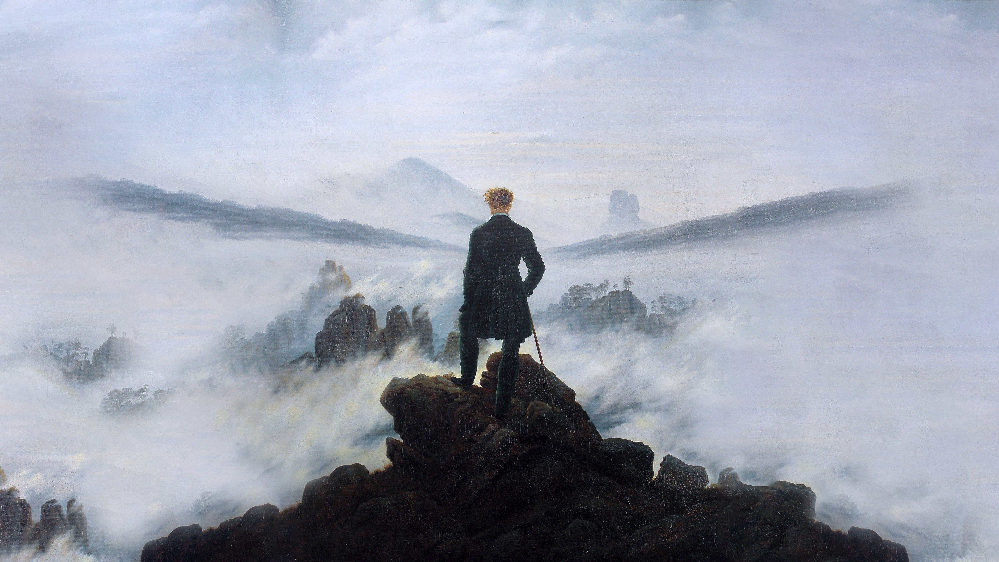

In [23]:
from PIL import Image
img = Image.open("WandererAboveTheSeaOfFogl.jpg")
img

In [24]:
preprocessed_img = preprocess(img) # passing through preprocess pipeline
batch_t = torch.unsqueeze(preprocessed_img, 0) # creates a new tensor batch_t by adding a singleton dimension at the beginning of the preprocessed_img tensor, effectively converting it into a batch with a batch size of 1. This is commonly done when you want to process a single image as if it were a batch of images

The process of running a trained model on new data is called inference in deep learning circles

In [25]:
# In order to do inference the network must be put in eval mode. If we forgot to do this then batch normalization and dropout will not produce meaningful answers

resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [26]:
out = resnet(batch_t)
out

tensor([[ 1.3524, -2.3688,  0.6078,  1.8381,  2.6121, -0.5555,  1.2710, -0.0480,
         -0.5192,  1.7683, -3.6523, -3.1155, -4.4365, -1.4731, -3.4331, -2.4627,
         -1.9295, -1.9516,  1.9954, -2.3120,  0.2321,  0.6388,  4.8519,  3.6433,
          0.7813,  0.4922, -0.5546, -1.1507, -1.5349, -0.7401, -2.5908, -2.3284,
         -2.3436,  1.6936,  2.6779, -1.7980, -1.0936, -3.3775, -1.0590,  2.5856,
         -2.0694, -2.3296,  0.1984, -1.2324, -2.2865, -1.0773, -1.1186, -1.8876,
         -1.0482, -0.2344, -0.3724,  0.5945, -2.2021, -2.4685, -1.4682, -2.7879,
         -2.4524, -3.5366, -2.4333, -1.5121, -0.8974, -2.1755, -1.0390, -1.8899,
         -1.2008,  0.5446, -2.2930,  1.3585, -1.2899, -1.9055, -4.9753, -1.2529,
         -3.6130, -2.4693, -3.5539, -4.4118,  1.0827, -1.5254, -5.5234, -2.1774,
          4.3378,  1.2964, -0.2836, -1.3158,  0.2090, -1.4930, -0.9647, -2.1188,
          0.1349, -0.6774, -2.1313, -1.0088, -3.6103,  1.7556, -3.6484, -2.2615,
          0.6792, -2.3913, -

In [27]:
with open('imagenet_classes.txt') as f:
    labels = [line.strip() for line in f.readlines()]

In [28]:
_, index = torch.max(out, 1) # the first element contains the max value themselves so _ is used to ignore it

In [29]:
percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100 # dimension of 1 and *100 to convert to percentage
labels[index[0]], percentage[index[0]].item() # item converts to python scalar

('alp', 16.832895278930664)

In [30]:
_, indices = torch.sort(out, descending=True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:5]]

[('alp', 16.832895278930664),
 ('cliff, drop, drop-off', 12.25711727142334),
 ('volcano', 10.782642364501953),
 ('shovel', 9.422868728637695),
 ('promontory, headland, head, foreland', 5.332590103149414)]